In [ ]:
import pandas as pd


In [ ]:
!pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 MB 7.5 MB/s eta 0:00:00


In [ ]:
!unzip /content/Malicious-Insider-Attack-Dataset.zip

unzip:  cannot find or open /content/Malicious-Insider-Attack-Dataset.zip, /content/Malicious-Insider-Attack-Dataset.zip.zip or /content/Malicious-Insider-Attack-Dataset.zip.ZIP.


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%pwd

'/content'

In [ ]:
import os
os.chdir('gdrive/MyDrive/ml_project')

In [ ]:
data=pd.read_csv("Malicious-Insider-Attack-Dataset.csv")

<ipython-input-10-b38c7ea3003e>:1: DtypeWarning: Columns (9,11) have mixed types. Specify dtype option on import or set low_memory=False.
  data=pd.read_csv("Malicious-Insider-Attack-Dataset.csv")


In [ ]:
data

,Unnamed: 0.1,Unnamed: 0,pkSeqID,stime,flgs,flgs_number,proto,proto_number,saddr,sport,...,TnP_Per_Dport,AR_P_Proto_P_SrcIP,AR_P_Proto_P_DstIP,N_IN_Conn_P_DstIP,N_IN_Conn_P_SrcIP,AR_P_Proto_P_Sport,AR_P_Proto_P_Dport,Pkts_P_State_P_Protocol_P_DestIP,Pkts_P_State_P_Protocol_P_SrcIP,attack
0,0,1650261,1650261,1.528103e+09,e,1,tcp,1,192.168.100.150,54110,...,700,1.26889,1.21662,40,38,1.56093,1.21662,328,308,1
1,1,1650262,1650262,1.528103e+09,e,1,tcp,1,192.168.100.150,54112,...,700,1.26889,1.21662,40,38,1.56107,1.21662,328,308,1
2,2,1650263,1650263,1.528103e+09,e,1,tcp,1,192.168.100.150,54114,...,700,1.26889,1.21662,40,38,1.24980,1.21662,328,308,1
3,3,1650264,1650264,1.528103e+09,e,1,tcp,1,192.168.100.150,54116,...,700,1.26889,1.21662,40,38,1.24986,1.21662,328,308,1
4,4,1650265,1650265,1.528103e+09,e,1,tcp,1,192.168.100.150,54118,...,700,1.26889,1.21662,40,38,1.24991,1.21662,328,308,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1927096,1927096,3577359,3577357,1.526352e+09,e,1,udp,3,192.168.100.3,36242,...,122,9.49326,6.83201,2,74,6.81487,9.49326,4,122,0
1927097,1927097,3577360,3577358,1.526352e+09,e,1,udp,3,192.168.100.3,63574,...,122,9.49326,6.83201,2,74,6.84924,9.49326,4,122,0
1927098,1927098,3577361,3577359,1.526352e+09,e,1,udp,3,192.168.100.3,59485,...,122,9.49326,7.19694,1,74,7.19694,9.49326,2,122,0
1927099,1927099,3577362,3577360,1.526352e+09,e,1,udp,3,192.168.100.3,20844,...,122,9.49326,7.12689,2,74,7.12398,9.49326,4,122,0


In [ ]:
#unwanted columns removing

unwanted_columns = ['Unnamed: 0.1','Unnamed: 0','pkSeqID','flgs_number',
                   'sport','pkts','bytes','state_number','seq','mean',
                   'stddev','sum','min','max','sbytes','dbytes','srate',
                   'TnBPSrcIP','TnBPDstIP','TnP_PSrcIP','TnP_PDstIP',
                   'AR_P_Proto_P_Sport','AR_P_Proto_P_Dport','stime',"attack","ltime","proto_number"]

In [ ]:
#unwanted_columns = ['Unnamed: 0',"attack","ltime","proto_number"]
data = data.drop(unwanted_columns,axis = 1)

In [ ]:
cat_cols=["flgs","saddr","daddr","dport","state","spkts","dpkts"]

In [ ]:
num_cols=["dur","rate","drate","TnP_PerProto","TnP_Per_Dport","AR_P_Proto_P_SrcIP","AR_P_Proto_P_DstIP","Pkts_P_State_P_Protocol_P_DestIP","Pkts_P_State_P_Protocol_P_SrcIP","N_IN_Conn_P_DstIP","N_IN_Conn_P_SrcIP"]

In [ ]:
data

,flgs,proto,saddr,daddr,dport,state,dur,spkts,dpkts,rate,drate,TnP_PerProto,TnP_Per_Dport,AR_P_Proto_P_SrcIP,AR_P_Proto_P_DstIP,N_IN_Conn_P_DstIP,N_IN_Conn_P_SrcIP,Pkts_P_State_P_Protocol_P_DestIP,Pkts_P_State_P_Protocol_P_SrcIP
0,e,tcp,192.168.100.150,192.168.100.3,80,RST,6.406424,6,4,1.404840,0.468280,328,700,1.26889,1.21662,40,38,328,308
1,e,tcp,192.168.100.150,192.168.100.3,80,RST,6.405851,6,4,1.404966,0.468322,328,700,1.26889,1.21662,40,38,328,308
2,e,tcp,192.168.100.150,192.168.100.3,80,RST,6.401038,5,3,1.093573,0.900214,328,700,1.26889,1.21662,40,38,328,308
3,e,tcp,192.168.100.150,192.168.100.3,80,RST,6.400703,5,3,1.093630,0.898208,328,700,1.26889,1.21662,40,38,328,308
4,e,tcp,192.168.100.150,192.168.100.3,80,RST,6.400472,5,3,1.093669,0.898394,328,700,1.26889,1.21662,40,38,328,308
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1927096,e,udp,192.168.100.3,205.251.194.102,53,CON,0.293476,1,1,3.407434,0.000000,142,122,9.49326,6.83201,2,74,4,122
1927097,e,udp,192.168.100.3,205.251.194.102,53,CON,0.292003,1,1,3.424622,0.000000,142,122,9.49326,6.83201,2,74,4,122
1927098,e,udp,192.168.100.3,205.251.194.154,53,CON,0.277896,1,1,3.598469,0.000000,142,122,9.49326,7.19694,1,74,2,122
1927099,e,udp,192.168.100.3,192.31.80.30,53,CON,0.280742,1,1,3.561990,0.000000,142,122,9.49326,7.12689,2,74,4,122


In [ ]:
# Separate the DataFrame into 'tcp' and 'udp' categories
tcp_df = data[data['proto'] == 'tcp']
udp_df = data[data['proto'] == 'udp']

# Randomly sample 50,000 rows from each category
tcp_sampled = tcp_df.sample(n=50000, replace=False)
udp_sampled = udp_df.sample(n=50000, replace=False)

# Concatenate the sampled rows
new_data = pd.concat([tcp_sampled, udp_sampled])

# Shuffle the concatenated DataFrame to randomize the order of rows
new_data = new_data.sample(frac=1).reset_index(drop=True)

# Print the first few rows of the sampled DataFrame
new_data.shape

(100000, 19)

In [ ]:
!pip install ydata_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.9/357.9 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 16.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 39.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 36.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 37.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=16476c82bb65417cc23d312777bc7e332db2dd7662c19ce5a9d886775e52ee08
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1


In [ ]:
import pandas as pd
from ydata_profiling import ProfileReport
profile = ProfileReport(new_data, title="Profiling Report")

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
data = new_data.copy()
data

,flgs,proto,saddr,daddr,dport,state,dur,spkts,dpkts,rate,drate,TnP_PerProto,TnP_Per_Dport,AR_P_Proto_P_SrcIP,AR_P_Proto_P_DstIP,N_IN_Conn_P_DstIP,N_IN_Conn_P_SrcIP,Pkts_P_State_P_Protocol_P_DestIP,Pkts_P_State_P_Protocol_P_SrcIP
0,e s,tcp,192.168.100.148,192.168.100.3,80,REQ,9.499690,4,0,0.315800,0.0,580,580,0.601599,0.589731,100,70,40,40
1,e,udp,192.168.100.150,192.168.100.3,80,INT,14.254762,8,0,0.491064,0.0,800,800,0.561141,0.561141,100,100,800,800
2,e s,tcp,192.168.100.148,192.168.100.3,80,RST,43.550159,6,1,0.137772,0.0,776,776,0.178200,0.178200,100,100,511,511
3,e,udp,192.168.100.148,192.168.100.3,80,INT,13.707645,11,0,0.729520,0.0,1100,1100,0.802471,0.802471,100,100,1100,1100
4,e s,tcp,192.168.100.147,192.168.100.3,80,RST,39.757168,5,1,0.125763,0.0,602,602,0.149823,0.150902,100,92,594,540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,e s,tcp,192.168.100.148,192.168.100.3,80,REQ,41.333076,4,0,0.072581,0.0,446,446,0.107679,0.109078,100,74,308,228
99996,e s,tcp,192.168.100.150,192.168.100.3,80,REQ,14.347638,3,0,0.139396,0.0,303,303,0.209101,0.211092,100,97,303,291
99997,e s,tcp,192.168.100.148,192.168.100.3,80,REQ,43.948547,6,1,0.136523,0.0,664,664,0.151109,0.151109,100,100,664,664
99998,e s,tcp,192.168.100.147,192.168.100.3,80,RST,12.383767,6,1,0.484505,0.0,564,564,0.455446,0.455446,100,100,224,224


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score
import plotly.express as px

# Apply label encoding to categorical column 'proto'
label_encoder = LabelEncoder()
data['proto'] = label_encoder.fit_transform(data['proto'])

# One-Hot Encoding for other categorical columns
data = pd.get_dummies(data, columns=cat_cols)

# Separate features and target variable
X = data.drop(columns=['proto'])
y = data['proto']

# Filter instances where 'proto' column is TCP or UDP
tcp_udp_indices = data[data['proto'].isin([label_encoder.transform(['tcp'])[0], label_encoder.transform(['udp'])[0]])].index
X_filtered = X.loc[tcp_udp_indices]
y_filtered = y.loc[tcp_udp_indices]

# Splitting the filtered data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_filtered, y_filtered, test_size=0.30, random_state=45542)

# Apply PCA to training set
pca = PCA(n_components=2)  # Adjust the number of components as needed
X_train_pca = pca.fit_transform(X_train)

# Apply PCA to test set
X_test_pca = pca.transform(X_test)

# Train XGBoost model
xgb_model = XGBClassifier()
xgb_model.fit(X_train_pca, y_train)

# Train LightGBM model
lgbm_model = LGBMClassifier()
lgbm_model.fit(X_train_pca, y_train)

# Train CatBoost model
catboost_model = CatBoostClassifier()
catboost_model.fit(X_train_pca, y_train)

# Make predictions
y_pred_xgb = xgb_model.predict(X_test_pca)
y_pred_lgbm = lgbm_model.predict(X_test_pca)
y_pred_catboost = catboost_model.predict(X_test_pca)

# Compute accuracy
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
accuracy_lgbm = accuracy_score(y_test, y_pred_lgbm)
accuracy_catboost = accuracy_score(y_test, y_pred_catboost)

# Print accuracies
print("XGBoost Accuracy:", accuracy_xgb)
print("LightGBM Accuracy:", accuracy_lgbm)
print("CatBoost Accuracy:", accuracy_catboost)



[LightGBM] [Info] Number of positive: 35044, number of negative: 34956
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 510
[LightGBM] [Info] Number of data points in the train set: 70000, number of used features: 2
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500629 -> initscore=0.002514
[LightGBM] [Info] Start training from score 0.002514
Learning rate set to 0.063211
0:	learn: 0.6105181	total: 61.8ms	remaining: 1m 1s
1:	learn: 0.5340324	total: 73.8ms	remaining: 36.8s
2:	learn: 0.4814196	total: 85.5ms	remaining: 28.4s
3:	learn: 0.4322080	total: 98.6ms	remaining: 24.6s
4:	learn: 0.3952071	total: 111ms	remaining: 22.2s
5:	learn: 0.3703957	total: 126ms	remaining: 20.8s
6:	learn: 0.3489447	total: 139ms	remaining: 19.7s
7:	learn: 0.3291487	total: 152ms	remaining: 18.9s
8:	learn: 0.3137363	total: 164ms	remaining: 18.1s
9:	learn: 0.2952003	total:

In [ ]:
# Plot PCA-transformed testing output for XGBoost
fig_xgb = px.scatter(x=X_test_pca[:, 0], y=X_test_pca[:, 1], color=y_pred_xgb, labels={'x': 'Principal Component 1', 'y': 'Principal Component 2'}, title='PCA-transformed Testing Output after XGBoost Classifier (TCP/UDP only)')
fig_xgb.update_traces(marker=dict(size=8, opacity=0.8))

# Plot PCA-transformed testing output for LightGBM
fig_lgbm = px.scatter(x=X_test_pca[:, 0], y=X_test_pca[:, 1], color=y_pred_lgbm, labels={'x': 'Principal Component 1', 'y': 'Principal Component 2'}, title='PCA-transformed Testing Output after LightGBM Classifier (TCP/UDP only)')
fig_lgbm.update_traces(marker=dict(size=8, opacity=0.8))

# Plot PCA-transformed testing output for CatBoost
fig_catboost = px.scatter(x=X_test_pca[:, 0], y=X_test_pca[:, 1], color=y_pred_catboost, labels={'x': 'Principal Component 1', 'y': 'Principal Component 2'}, title='PCA-transformed Testing Output after CatBoost Classifier (TCP/UDP only)')
fig_catboost.update_traces(marker=dict(size=8, opacity=0.8))

# Show all plots
fig_xgb.show()
fig_lgbm.show()
fig_catboost.show()


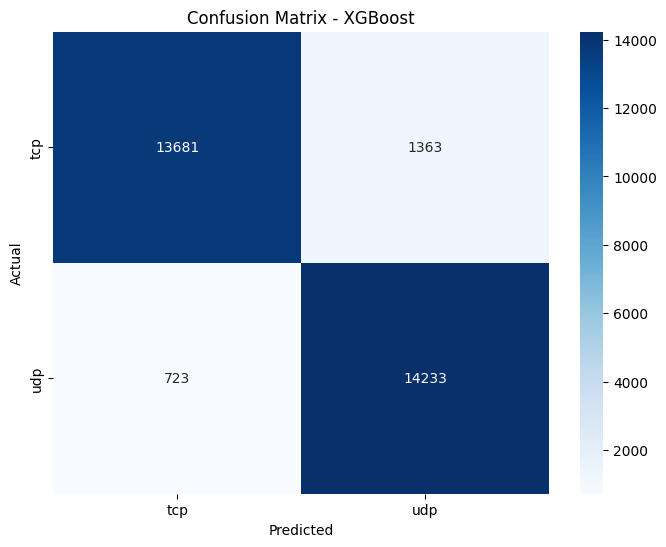

Classification Report - XGBoost:
              precision    recall  f1-score   support

           0       0.95      0.91      0.93     15044
           1       0.91      0.95      0.93     14956

    accuracy                           0.93     30000
   macro avg       0.93      0.93      0.93     30000
weighted avg       0.93      0.93      0.93     30000



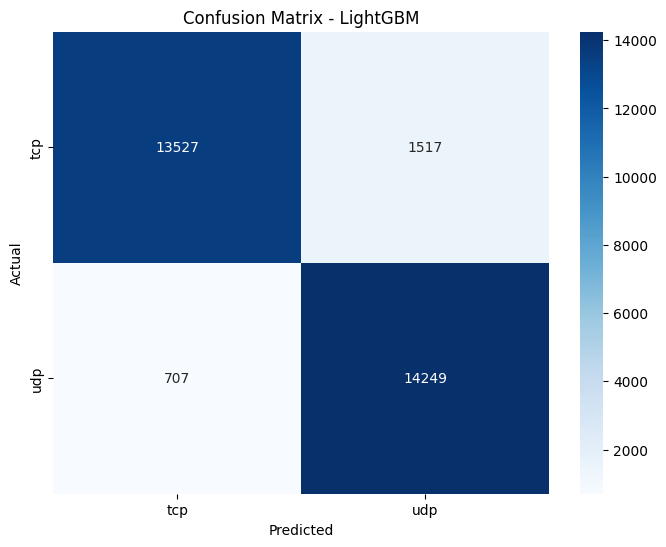

Classification Report - LightGBM:
              precision    recall  f1-score   support

           0       0.95      0.90      0.92     15044
           1       0.90      0.95      0.93     14956

    accuracy                           0.93     30000
   macro avg       0.93      0.93      0.93     30000
weighted avg       0.93      0.93      0.93     30000



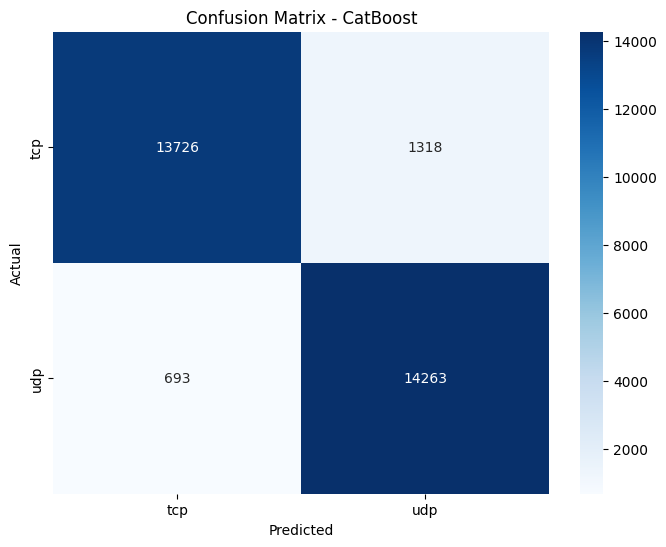

Classification Report - CatBoost:
              precision    recall  f1-score   support

           0       0.95      0.91      0.93     15044
           1       0.92      0.95      0.93     14956

    accuracy                           0.93     30000
   macro avg       0.93      0.93      0.93     30000
weighted avg       0.93      0.93      0.93     30000



In [ ]:
from sklearn.metrics import classification_report,confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
# Function to plot confusion matrix and print classification report
def plot_confusion_and_report(model_name, y_true, y_pred):
    # Plot confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    plt.title(f'Confusion Matrix - {model_name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Print classification report
    print(f"Classification Report - {model_name}:")
    print(classification_report(y_true, y_pred))

# Plot confusion matrix and print classification report for XGBoost
plot_confusion_and_report("XGBoost", y_test, y_pred_xgb)

# Plot confusion matrix and print classification report for LightGBM
plot_confusion_and_report("LightGBM", y_test, y_pred_lgbm)

# Plot confusion matrix and print classification report for CatBoost
plot_confusion_and_report("CatBoost", y_test, y_pred_catboost)


Number of components = 1 and explained variance = 0.7833465815902402
Number of components = 2 and explained variance = 0.9638329442703116
Number of components = 3 and explained variance = 0.9966731398934895
Number of components = 4 and explained variance = 0.9995523304144798
Number of components = 5 and explained variance = 0.9999546789505979
Number of components = 6 and explained variance = 0.9999764465860931
Number of components = 7 and explained variance = 0.9999892043654771
Number of components = 8 and explained variance = 0.9999973461334161
Number of components = 9 and explained variance = 0.9999995006632143
Number of components = 10 and explained variance = 0.9999996859821366
Number of components = 11 and explained variance = 0.9999997506638111
Number of components = 12 and explained variance = 0.9999997949575316
Number of components = 13 and explained variance = 0.999999829104497
Number of components = 14 and explained variance = 0.9999998570211107
Number of components = 15 and 

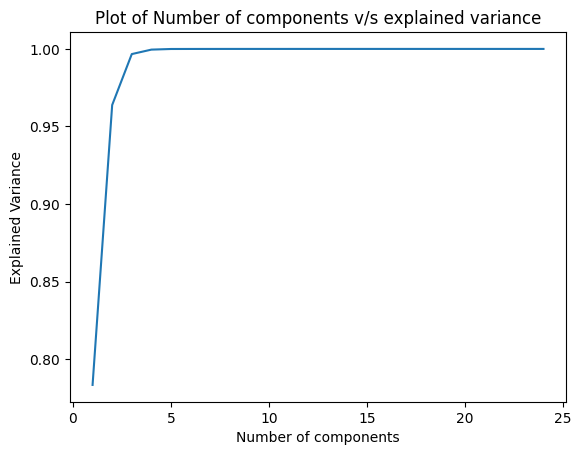

Duration: 41.71858286857605 seconds


In [ ]:
from sklearn.decomposition import TruncatedSVD
import matplotlib.pyplot as plt
import time
start = time.time()
# Program to find the optimal number of components for Truncated SVD
n_comp = [] # list containing different values of components
explained = [] # explained variance ratio for each component of Truncated SVD
for x in range(1,25):
    n_comp.append(x)
    svd = TruncatedSVD(n_components=x)
    svd.fit(X_train)
    explained.append(svd.explained_variance_ratio_.sum())
    print("Number of components = %r and explained variance = %r"%(x,svd.explained_variance_ratio_.sum()))
    # Print the components
#     print("Components:")
#     print(svd.components_)
#     print("-----------------------------------------------------------------------------------------")
#     print()
plt.plot(n_comp, explained)
plt.xlabel('Number of components')
plt.ylabel("Explained Variance")
plt.title("Plot of Number of components v/s explained variance")
plt.show()
print('Duration: {} seconds'.format(time.time() - start))

Number of components = 1 and explained variance = 0.7959042913279522
Number of components = 2 and explained variance = 0.9744932348801589
Number of components = 3 and explained variance = 0.9972115586703988
Number of components = 4 and explained variance = 0.9999399878830154
Number of components = 5 and explained variance = 0.9999756400760607
Number of components = 6 and explained variance = 0.9999885345697742
Number of components = 7 and explained variance = 0.9999967338114363
Number of components = 8 and explained variance = 0.9999988883831739
Number of components = 9 and explained variance = 0.9999995016487152
Number of components = 10 and explained variance = 0.999999686242161
Number of components = 11 and explained variance = 0.9999997509006354
Number of components = 12 and explained variance = 0.9999997951891257
Number of components = 13 and explained variance = 0.9999998293348166
Number of components = 14 and explained variance = 0.9999998572509815
Number of components = 15 and 

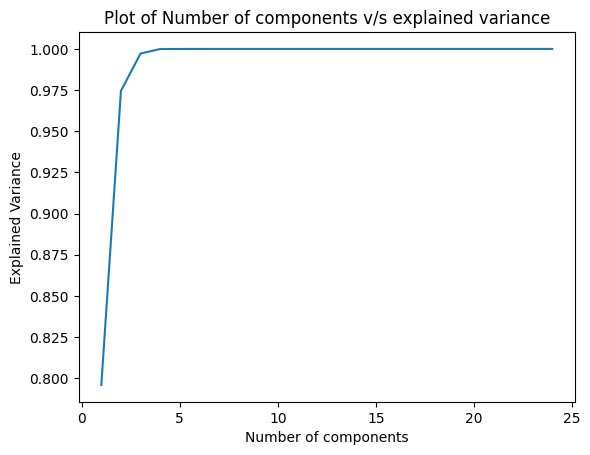

Duration: 61.75346636772156 seconds


In [ ]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import time
start = time.time()
# Program to find the optimal number of components for Truncated SVD
n_comp = [] # list containing different values of components
explained = [] # explained variance ratio for each component of Truncated SVD
for x in range(1,25):
    n_comp.append(x)
    svd = PCA(n_components=x)
    svd.fit(X_train)
    explained.append(svd.explained_variance_ratio_.sum())
    print("Number of components = %r and explained variance = %r"%(x,svd.explained_variance_ratio_.sum()))
    # Print the components
#     print("Components:")
#     print(svd.components_)
#     print("-----------------------------------------------------------------------------------------")
#     print()
plt.plot(n_comp, explained)
plt.xlabel('Number of components')
plt.ylabel("Explained Variance")
plt.title("Plot of Number of components v/s explained variance")
plt.show()
print('Duration: {} seconds'.format(time.time() - start))

In [ ]:
data = new_data.copy()
data

,flgs,proto,saddr,daddr,dport,state,dur,spkts,dpkts,rate,drate,TnP_PerProto,TnP_Per_Dport,AR_P_Proto_P_SrcIP,AR_P_Proto_P_DstIP,N_IN_Conn_P_DstIP,N_IN_Conn_P_SrcIP,Pkts_P_State_P_Protocol_P_DestIP,Pkts_P_State_P_Protocol_P_SrcIP
0,e s,tcp,192.168.100.148,192.168.100.3,80,REQ,9.499690,4,0,0.315800,0.0,580,580,0.601599,0.589731,100,70,40,40
1,e,udp,192.168.100.150,192.168.100.3,80,INT,14.254762,8,0,0.491064,0.0,800,800,0.561141,0.561141,100,100,800,800
2,e s,tcp,192.168.100.148,192.168.100.3,80,RST,43.550159,6,1,0.137772,0.0,776,776,0.178200,0.178200,100,100,511,511
3,e,udp,192.168.100.148,192.168.100.3,80,INT,13.707645,11,0,0.729520,0.0,1100,1100,0.802471,0.802471,100,100,1100,1100
4,e s,tcp,192.168.100.147,192.168.100.3,80,RST,39.757168,5,1,0.125763,0.0,602,602,0.149823,0.150902,100,92,594,540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,e s,tcp,192.168.100.148,192.168.100.3,80,REQ,41.333076,4,0,0.072581,0.0,446,446,0.107679,0.109078,100,74,308,228
99996,e s,tcp,192.168.100.150,192.168.100.3,80,REQ,14.347638,3,0,0.139396,0.0,303,303,0.209101,0.211092,100,97,303,291
99997,e s,tcp,192.168.100.148,192.168.100.3,80,REQ,43.948547,6,1,0.136523,0.0,664,664,0.151109,0.151109,100,100,664,664
99998,e s,tcp,192.168.100.147,192.168.100.3,80,RST,12.383767,6,1,0.484505,0.0,564,564,0.455446,0.455446,100,100,224,224


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 8, 64)             256       
                                                                 
 batch_normalization (Batch  (None, 8, 64)             256       
 Normalization)                                                  
                                                                 
 max_pooling1d (MaxPooling1  (None, 4, 64)             0         
 D)                                                              
                                                                 
 dropout (Dropout)           (None, 4, 64)             0         
                                                                 
 conv1d_1 (Conv1D)           (None, 2, 32)             6176      
                                                                 
 batch_normalization_1 (Bat  (None, 2, 32)             1

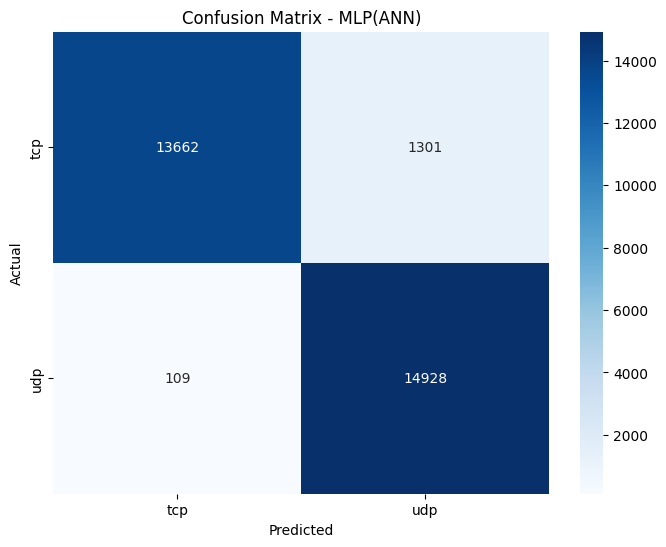

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.91      0.95     14963
           1       0.92      0.99      0.95     15037

    accuracy                           0.95     30000
   macro avg       0.96      0.95      0.95     30000
weighted avg       0.96      0.95      0.95     30000



In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.callbacks import Callback
import seaborn as sns
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Flatten, Dropout, MaxPooling1D, BatchNormalization
from tensorflow.keras.layers import Conv1D, Dense, Flatten
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

# Custom callback to record accuracy after each epoch
class EpochAccuracyCallback(Callback):
    def __init__(self):
        self.epoch_accuracy = []

    def on_epoch_end(self, epoch, logs={}):
        self.epoch_accuracy.append(logs.get('accuracy'))

# Apply label encoding to categorical column 'proto'
label_encoder = LabelEncoder()
data['proto'] = label_encoder.fit_transform(data['proto'])

# One-Hot Encoding for other categorical columns
data = pd.get_dummies(data, columns=cat_cols)

# Separate features and target variable
X = data.drop(columns=['proto'])
y = data['proto']

# Filter instances where 'proto' column is TCP or UDP
tcp_udp_indices = data[data['proto'].isin([label_encoder.transform(['tcp'])[0], label_encoder.transform(['udp'])[0]])].index
X_filtered = X.loc[tcp_udp_indices]
y_filtered = y.loc[tcp_udp_indices]

# Splitting the filtered data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_filtered, y_filtered, test_size=0.30, random_state=456654)

# Apply PCA with 10 components
pca = PCA(n_components=10)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Convert to numpy arrays and reshape for Conv1D
X_train_pca = np.array(X_train_pca).reshape(X_train_pca.shape[0], X_train_pca.shape[1], 1)
X_test_pca = np.array(X_test_pca).reshape(X_test_pca.shape[0], X_test_pca.shape[1], 1)

# Define the model
model = Sequential()

# Add Conv1D layer with input shape (10, 1)
model.add(Conv1D(64, 3, activation="relu", input_shape=(10, 1)))
model.add(BatchNormalization())  # Add Batch Normalization
model.add(MaxPooling1D(pool_size=2))  # Add MaxPooling1D with pool size 2
model.add(Dropout(0.5))  # Adding dropout with rate 0.5

# Add Conv1D layer
model.add(Conv1D(32, 3, activation="relu"))
model.add(BatchNormalization())  # Add Batch Normalization
model.add(MaxPooling1D(pool_size=2))  # Add MaxPooling1D with pool size 2
model.add(Dropout(0.5))  # Adding dropout with rate 0.5

# Flatten the output
model.add(Flatten())

# Add Dense layer
model.add(Dense(32, activation="relu"))
model.add(Dense(16, activation="relu"))

# Add Dense layer
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Print model summary
model.summary()


# Create an instance of the custom callback
epoch_acc_callback = EpochAccuracyCallback()

# Train the model with the custom callback
history = model.fit(X_train_pca, y_train, epochs=15, batch_size=32, validation_data=(X_test_pca, y_test), callbacks=[epoch_acc_callback])

"""
# Plot epoch accuracy graph
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Epoch Accuracy')
plt.legend()
plt.show()
"""
# Make predictions
y_pred_prob = model.predict(X_test_pca)
y_pred = (y_pred_prob > 0.5).astype(int)

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix - MLP(ANN)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Print classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))


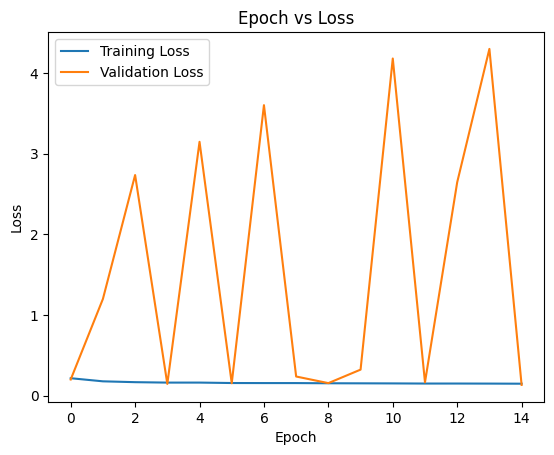

In [ ]:
# Plot epoch accuracy graph
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Epoch vs Loss')
plt.legend()
plt.show()
